<a href="https://colab.research.google.com/github/mpbasto/TL-predicts-doggos/blob/main/predict_doggos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#🐶 End-to-end Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.  

## 1. Problem

Identifying the breed of a dog given an image of a dog.

> “When I'm sitting at the park and a dog passes by, I want to know what breed it is just by submitting its photo.”

## 2. Data

The data we are using is from [Kaggle's Dog Breed Identification Competition](https://www.kaggle.com/c/dog-breed-identification/data).

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image. 

For more info follow: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with unstructured data(images), so it would be best to use deep learning/transfer learning.
* There are 120 breeds of dogs, which means 120 different classes.
* There are around 10,000+ images in the training set(labelled).
* There are around 10,000+ images in the test set(unlabelled for prediction purposes).


In [ ]:
# unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/Dog Vision/"

### Prepare workspace

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub (to pick a model) ✅
* Ensure we are using a GPU ✅

In [ ]:
# Import TensforFlow into Colab
#import tensorflow as tf
#print('TF version:', tf.__version__)

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for GPU availability
print('GPU', 'Available! *Chandler is doing his victory dance*' if tf.config.list_physical_devices('GPU') else 'Not available *Joey sad*')

TF version: 2.7.0
TF Hub version: 0.12.0
GPU Available! *Chandler is doing his victory dance*


## Getting data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. Therefore, the first step will be turning our images into Tensors, which are numerical representations.

Starting by checking the labels in our data:


In [ ]:
# Checkout labels of our data
import pandas as pd

labels_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Dog Vision/labels.csv')
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


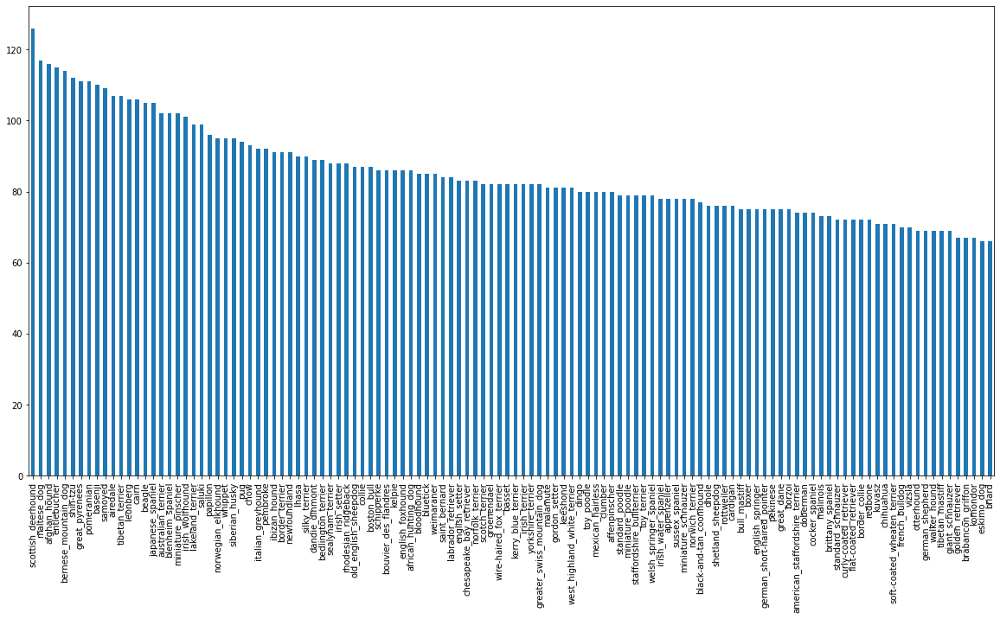

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

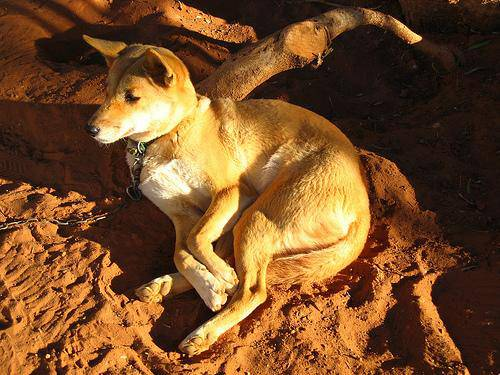

In [ ]:
# To view an image
from IPython.display import Image, display
Image('drive/MyDrive/Colab Notebooks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')


### Getting images and their labels

I am going to grab a list of all our image files' path names.

In [ ]:
# Create path names from image IDs
filenames = ['drive/MyDrive/Colab Notebooks/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Checking the first 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

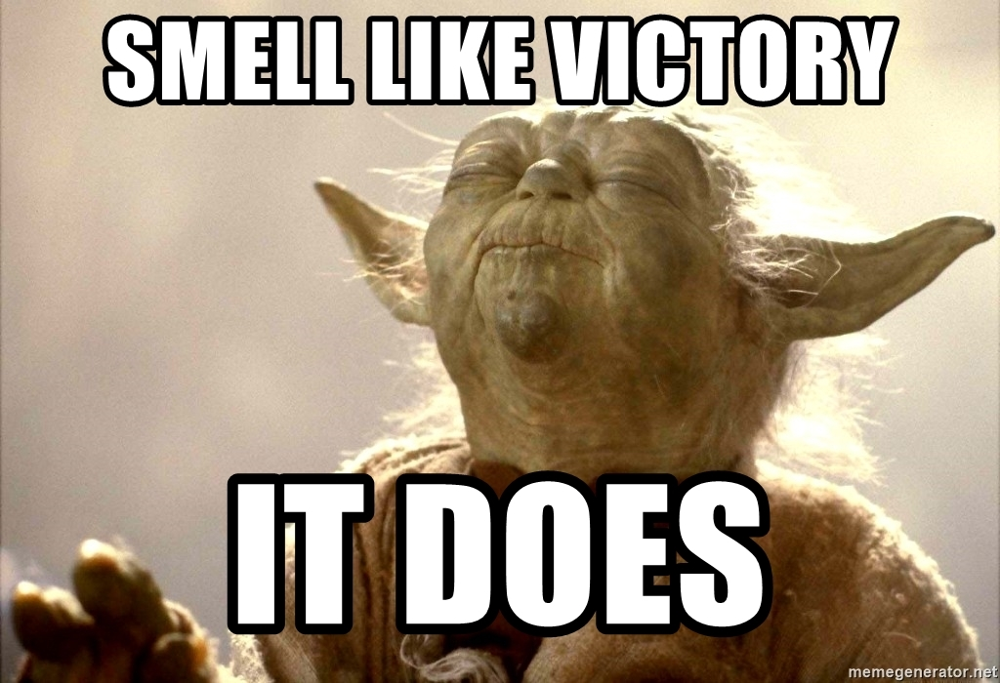


Hooray!! Filenames match actual amount of files.


In [ ]:
# Checking if nr of filenames matches nr of actual image files
import os
import requests

if len(os.listdir('drive/MyDrive/Colab Notebooks/Dog Vision/train/')) == len(filenames):
  display(Image(requests.get('https://memegenerator.net/img/instances/73192357/smell-like-victory-it-does.jpg').content, height=200, width=300))
  print('\nHooray!! Filenames match actual amount of files.')
else:
  display(Image(requests.get('https://memegenerator.net/img/instances/60860331/oh-dear.jpg').content, height=200, width=300))
  print('\nSomething\'s wrong! Filenames do not match actual amount of files. Check the target directory.')


Now that I've gathered all training image filepaths in a list, I am going to prepare the labels.

In [ ]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
len(labels)

10222

In [ ]:
# Looking at the labels
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

To check if any data is missing, I'm using the same method as earlier:

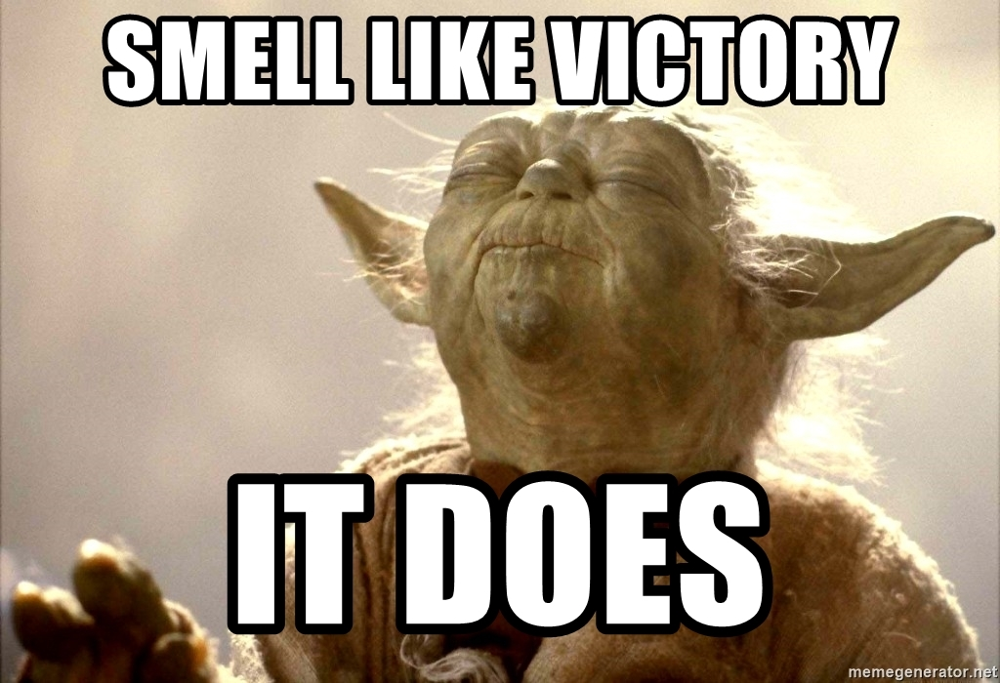


Hooray!! Number of labels matches number of filenames.


In [ ]:
# Check if nr of labels matches nr of filenames
if len(labels) == len(filenames):
  display(Image(requests.get('https://memegenerator.net/img/instances/73192357/smell-like-victory-it-does.jpg').content, height=200, width=300))
  print('\nHooray!! Number of labels matches number of filenames.')
else:
  display(Image(requests.get('https://memegenerator.net/img/instances/60860331/oh-dear.jpg').content, height=200, width=300))
  print('\nSomething\'s wrong! Number of labels does not match number of filenames. Check data directories.')


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Confirming there is indeed 120 breeds of dogs
len(unique_breeds)

120

What if we transform the labels into booleans?

In [ ]:
# Turn a single label into an array of booleans
print('The chosen label is: ', labels[0])
labels[0] == unique_breeds

The chosen label is:  boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

Comparing the chosen label to the `unique_breeds` array, we can see that everywhere in `unique_breeds` comes up as **False** with the exception of the chosen label's location.

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Confirming
print('Number of boolean labels: ', len(boolean_labels), '\nNumber of labels: ', len(labels))

Number of boolean labels:  10222 
Number of labels:  10222


Can we transform these boolean arrays into numerical data?

In [ ]:
# Example: Turning boolean array into ints
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0 ])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # 1 = True, 0 = False

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating a Validation Set

Since the dataset from Kaggle does not provide a validation set, I am going to create my own.

In [ ]:
# Set up X & y
X = filenames
y = boolean_labels

I am starting off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Splitting data into train & validation sets of total size NUM_IMAGES
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Peeking at training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Colab Notebooks/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

Now we can finally turn the images and labels into Tensors.

### Preprocessing Images (turning images into Tensors)

To preprocess images into tensors I am going to write a function which will do the following:


1.   Take the filepath of an image as input
2.   Use TensorFlow to read the file and save it to a variable (`image`)
3.   Turn `image` (.jpg) into tensors
4.   [Normalize](https://en.wikipedia.org/wiki/Normalization_(image_processing)) image (convert the colour channel values from 0-255 to 0-1)
5.   Resize the `image` to be a shape of (224, 224)
6.   Return the modified `image`


Before that, I want to see what importing an image looks like.


In [ ]:
# Convert an image to Numpy
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Turning image into tensor and comparing to np array
print('This is a Numpy Array:\n',image[:2],'\n\n This is a Tensor:\n', tf.constant(image)[:2])

This is a Numpy Array:
 [[[ 89 137  87]
  [ 76 124  74]
  [ 63 111  59]
  ...
  [ 76 134  86]
  [ 76 134  86]
  [ 76 134  86]]

 [[ 72 119  73]
  [ 67 114  68]
  [ 63 111  63]
  ...
  [ 75 131  84]
  [ 74 132  84]
  [ 74 131  86]]] 

 This is a Tensor:
 tf.Tensor(
[[[ 89 137  87]
  [ 76 124  74]
  [ 63 111  59]
  ...
  [ 76 134  86]
  [ 76 134  86]
  [ 76 134  86]]

 [[ 72 119  73]
  [ 67 114  68]
  [ 63 111  63]
  ...
  [ 75 131  84]
  [ 74 132  84]
  [ 74 131  86]]], shape=(2, 350, 3), dtype=uint8)


This is how an image looks like as a tensor, so I am now going to proceed with preprocessing them using a function.

In [ ]:
# Define image size
IMG_SIZE = 224

# Creating a func for preprocessing images
def process_img(img_path, img_size=IMG_SIZE):
  """
  Takes an image path and turns the image into a tensor.
  """
  # Reading an image file
  image = tf.io.read_file(img_path)
  # Turning jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Converting colour channel values from 0-255 to 0-1 (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resizing image to desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

### Turning Data into Batches

**Why turn data into batches?**
Imagine you are trying to process 10,000+ images in one go. Your machine's memory (or any GPU you may use) might not have enough space to fit them all, and it's going to slow down all your processes.

So that is the reason behind turning data into batches, usually of about 32 images at a time. The batch size can be manually adjusted if necessary without jeopardizing speed.


>  *Training with large minibatches is bad for your health.
More importantly, it's bad for your test error.
Friends dont let friends use minibatches larger than 32.* - Yann LeCun


In order to use TensorFlow effectively, the data needs to be in the form of tensor tuples, which look like:
`(image, label)`.

In [ ]:
# Creating a func to return a tuple (image, label)
def get_img_label(img_path, label):
  """
  Takes a file path name of an image and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_img(img_path)
  return image, label

In [ ]:
# Demo of above func
(process_img(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now that there's a way to turn our data into tuples of tensors in the form `(image, label)`, I am making a function to turn all data into batches.

In [ ]:
# Define batch size = 32
BATCH_SIZE = 32

# Creating a func to turn data into batches
def create_data_batches(X, y= None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but does not shuffle if it's validation data.
  Also, it accepts test data as input (no labels).
  """
  # If data is a test dataset, we probably do not have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # no labels, only filepaths
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  # If data is a validation dataset, we do not need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping process_img function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Creating (image, label) tuples - also turns image path into a preprocessed image
    data = data.map(get_img_label)

    # Turning training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Creating train & valid data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checking different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

The data is now in batches, but these can be quite hard to comprehend. I am going to visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Creating a func to view images in a data batch
def show_25(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Set up fig
  plt.figure(figsize=(10, 10))
  # Loop through 25
  for i in range(25):
    # Creating subplots (5, 5)
    ax = plt.subplot(5, 5, i+1) # (rows, columns, index)
    # Displaying image
    plt.imshow(images[i])
    # Adding image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turning grid lines off
    plt.axis('off')
                 

In [ ]:
# We need to unbatch data for visualization purposes
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.8067039 , 0.70866466, 0.3165078 ],
          [0.8113144 , 0.71327513, 0.32111824],
          [0.81992304, 0.7218838 , 0.3297269 ],
          ...,
          [0.81200325, 0.61984634, 0.36102277],
          [0.80392164, 0.6117647 , 0.3529412 ],
          [0.80392164, 0.6117647 , 0.3529412 ]],
 
         [[0.8078432 , 0.70980394, 0.31764707],
          [0.8141927 , 0.71615344, 0.32399657],
          [0.8225554 , 0.72451615, 0.33235928],
          ...,
          [0.8117648 , 0.61960787, 0.36078432],
          [0.80392164, 0.6117647 , 0.3529412 ],
          [0.80392164, 0.6117647 , 0.3529412 ]],
 
         [[0.81058514, 0.7125459 , 0.320389  ],
          [0.8159402 , 0.71790093, 0.32574406],
          [0.8246255 , 0.7265862 , 0.33442932],
          ...,
          [0.8080901 , 0.6159332 , 0.35626054],
          [0.80392164, 0.6117647 , 0.3520921 ],
          [0.80392164, 0.6117647 , 0.3520921 ]],
 
         ...,
 
         [[0.60776883, 0.2959384 , 0.0913675 ],
          [0.62183

In [ ]:
len(train_images), len(train_labels) # should be equal to BATCH_SIZE

(32, 32)

Now, let's visualize the data in the training batch.

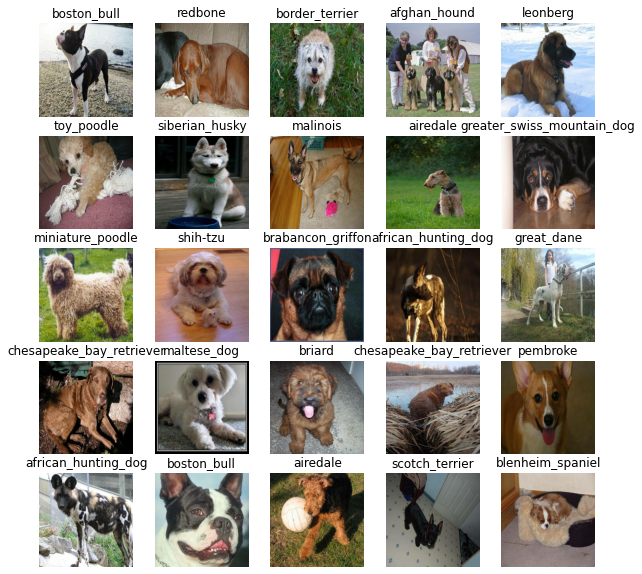

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25(train_images, train_labels)

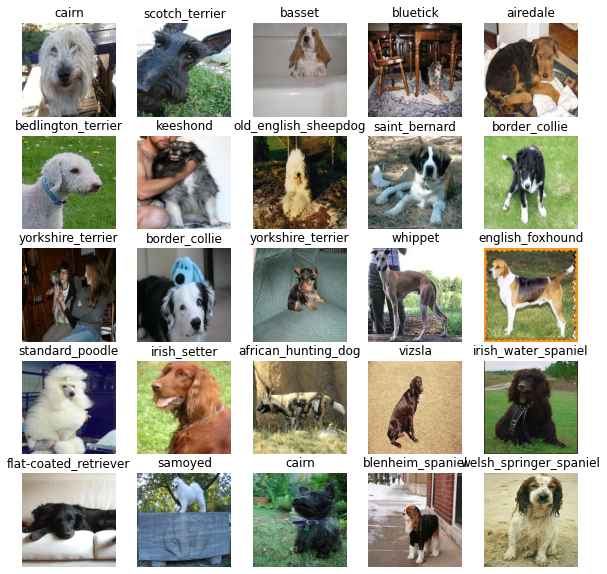

In [ ]:
# Visualizing validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25(val_images, val_labels)

## Building a model

Before building a model, there are a few things one needs to define:


*   The input shape (the images shape, in the form of tensors) to the model.
*   The output shape (image labels, in the form of tensors) of the model.
*   The URL of the model to be used (exploring [TensorFlow Hub](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5).



In [ ]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Set up output shape to the model
OUTPUT_SHAPE = len(unique_breeds) # 120

# Set up model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

The inputs, outputs and model are ready to go. Now it's time to put them together into a Keras deep learning model.

A function will be created, which:
* Takes input & output shapes.
* Takes the chosen model as parameters.
* Defines the layers in a Keras model in sequential fashion (a 'linear step-by-step' process).
* Compiles model (says how it should be evaluated and improved).
* Builds the model (tells the model which input shape it will be getting).
* Returns the model.

All steps can be found [here](https://www.tensorflow.org/guide/keras/sequential_model).

In [ ]:
# Create a func that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  - Takes a chosen Keras model URL and builds it according to given input and output shapes.
  - Defines the layers in sequential fashion.
  - Compiles model and provides optimization options.
  - Suggests input shape when building model.
  - Returns the model.
  """
  print('Building model with: ', MODEL_URL)

  # Set up model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # Layer 2 (output)
  ])

  # Compile model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy'] 
  )

  # Build model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions that a model can use during training to do things such as save its progress, check its progress or stop training early if a model does not improve.

I am going to create two callbacks:
* For TensorBoard - helps tracking the model's progress.
* For early stopping - preventing the model from training for too long.

### TensorBoard Callback

In order to set up a TensorBoard callback, it is necessary to do three things:
1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs into a directory and pass it to the model's `fit()` function. ✅
3. Visualize the model's training logs with the `%tensorboard` magic function (to do after model training). ✅

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Creating a func to build a TensorBoard callback
def create_tensorboard_callback():
  """
  Builds a TensorBoard callback to help tracking a model's performance and compare it to others.

  - Creates a directory to save the logs.
  - Adds tracking (date/time info).
  """
  # Creating a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Colab Notebooks/Dog Vision/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

[Early stopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping) helps stop the model from overfitting. If a certain evaluation metric stops improving, this will stop model training.

In [ ]:
# Creating early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on a subset of data)

The first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: 'slider', min:10, max:100, step:10}

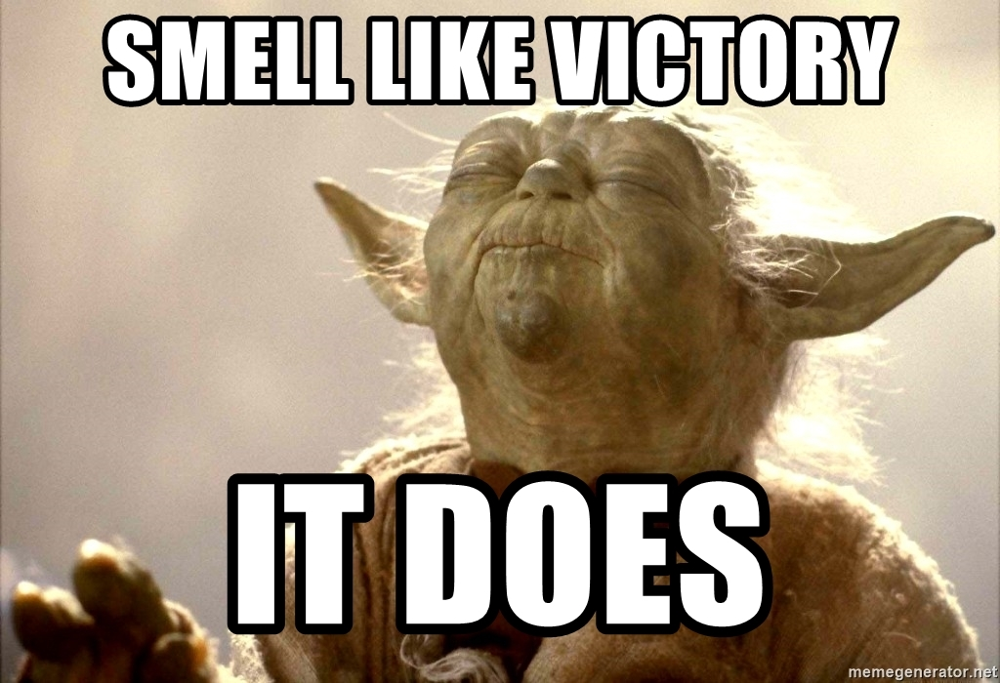


Hooray!! We got a GPU!


In [ ]:
# Checking to ensure I'm still running on a GPU

if tf.config.list_physical_devices('GPU'):
  display(Image(requests.get('https://memegenerator.net/img/instances/73192357/smell-like-victory-it-does.jpg').content, height=200, width=300))
  print('\nHooray!! We got a GPU!')
else:
  display(Image(requests.get('https://memegenerator.net/img/instances/60860331/oh-dear.jpg').content, height=200, width=300))
  print('\nOh dear! It seems that there is no GPU available.')

Let's create a function which trains a model.

* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call `fit()` on the model, passing it the training, validation, number of epochs to train for (`NUM_EPOCHS`) and the callbacks to be used.
* Return the model.

In [ ]:
# Building a func to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit model to the data passing it the callbacks previously created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Returning fitted model
  return model

In [ ]:
# Fit model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 104s 2s/step - loss: 4.5777 - accuracy: 0.1138 - val_loss: 3.2697 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 154ms/step - loss: 1.6357 - accuracy: 0.6750 - val_loss: 2.0697 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 4s 157ms/step - loss: 0.5698 - accuracy: 0.9388 - val_loss: 1.5771 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 4s 157ms/step - loss: 0.2564 - accuracy: 0.9887 - val_loss: 1.4205 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 3s 134ms/step - loss: 0.1487 - accuracy: 0.9962 - val_loss: 1.3635 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 4s 156ms/step - loss: 0.1011 - accuracy: 0.9987 - val_loss: 1.3121 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

**Question:** It appears that the model is overfitting because it's performing far better on the training dataset than the validation set. What are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing, because it means the model is learning!


These are worth reading: 
* https://machinelearningmastery.com/introduction-to-regularization-to-reduce-overfitting-and-improve-generalization-error/

* https://towardsdatascience.com/preventing-deep-neural-network-from-overfitting-953458db800a

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory previously created and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 114ms/step


array([[1.04664953e-03, 1.90377861e-04, 1.83288392e-03, ...,
        4.66809637e-04, 1.10979832e-04, 1.85631099e-03],
       [6.65060012e-03, 1.50315883e-03, 1.89147033e-02, ...,
        2.76793493e-03, 2.69105262e-03, 1.62930298e-03],
       [2.40428217e-05, 2.07557005e-05, 1.17361065e-04, ...,
        3.06550501e-04, 5.91249518e-05, 2.21259063e-04],
       ...,
       [1.46860721e-05, 2.63445429e-04, 6.28754031e-04, ...,
        6.31159273e-05, 1.16282084e-04, 2.87159666e-04],
       [7.47322990e-03, 1.07761519e-03, 4.13925212e-04, ...,
        5.52234880e-04, 1.90312086e-04, 2.97920518e-02],
       [1.78355724e-04, 1.20822646e-04, 2.31907703e-03, ...,
        2.26179371e-03, 8.75276397e-04, 4.76739187e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
predictions[0]

array([1.04664953e-03, 1.90377861e-04, 1.83288392e-03, 3.99481287e-05,
       2.39301735e-04, 7.07963773e-06, 5.43486793e-03, 1.79015959e-04,
       2.96161801e-04, 3.95668729e-04, 1.10885152e-03, 1.04019338e-04,
       2.28983583e-04, 1.10504261e-04, 7.16649403e-04, 1.79316514e-04,
       2.32285638e-05, 7.80394450e-02, 8.06887056e-06, 2.44219209e-05,
       7.22783443e-04, 9.82562269e-05, 3.70607777e-05, 4.75790614e-04,
       2.02017382e-05, 1.63830133e-04, 6.06918335e-01, 4.60046649e-05,
       5.69937984e-04, 7.04403501e-05, 1.33314124e-05, 4.39271273e-04,
       2.75660772e-04, 2.20475922e-05, 1.11123909e-05, 4.92571481e-03,
       3.40112456e-05, 1.98303285e-04, 1.26573592e-04, 4.07386746e-04,
       5.37939544e-04, 1.18884300e-05, 1.12454676e-04, 7.52851629e-05,
       2.75049806e-05, 4.04638413e-05, 1.49361404e-05, 3.22389824e-04,
       5.97665668e-04, 2.51553196e-04, 7.28057494e-05, 1.25671077e-05,
       5.98350307e-04, 8.11359787e-05, 2.45231873e-04, 1.53453919e-04,
      

In [ ]:
# First prediction
index = 42 
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[4.27424762e-04 2.54494284e-04 3.68792564e-04 4.34529939e-05
 1.64656376e-03 3.52320239e-05 4.24245343e-04 9.62240098e-04
 1.76370628e-02 1.74174607e-02 4.50604603e-05 3.24185894e-05
 2.38611060e-03 9.50842071e-03 6.31408533e-04 4.83674230e-03
 5.68820724e-05 3.12671589e-04 1.00350131e-04 3.22457607e-04
 1.42200370e-04 2.95636506e-04 1.38431293e-04 2.36443211e-05
 7.65450252e-03 2.94102792e-04 1.94233962e-05 9.21884319e-04
 4.14205948e-04 1.99516871e-05 3.85961066e-05 1.01110083e-04
 8.31841317e-05 7.15318238e-05 9.40961545e-05 4.50006883e-05
 4.59827352e-05 1.64737750e-04 4.73098698e-05 2.54353851e-01
 2.42615366e-04 3.83655351e-05 8.11346807e-03 2.03736254e-05
 6.30623195e-04 2.45803676e-04 6.51226728e-04 7.16349750e-04
 1.28881860e-04 6.42084633e-04 4.75222223e-05 2.39898727e-04
 2.58329965e-04 1.85140595e-03 1.98925809e-05 1.32483977e-03
 2.42511494e-04 1.77516529e-04 2.64157134e-04 5.17447188e-05
 9.17839789e-05 8.94784695e-04 7.13279724e-06 5.21572183e-05
 3.90416593e-04 2.336534

Having the above functionality is great but it needs to be at scale, and it would be even better if it was possible to see the image that the prediction is being made upon.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'brittany_spaniel'

Since the validation data is still in a batch dataset, it is necessary to unbatch it in order to make predictions on the validation images and compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) tensors are returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now there are ways to get:
* Prediction labels
* Validations labels (truth labels)
* Validation images

To make all these a bit more visual, I'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on whether the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

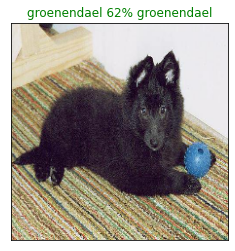

In [ ]:
plot_pred(prediction_probabilities= predictions, labels=val_labels, images=val_images, n=77)

Let's make another to view the model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer. ✅
* Find the predicted label using `get_pred_label()`. ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, colouring the true label green. ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] #DESC order
  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  # Changed colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass


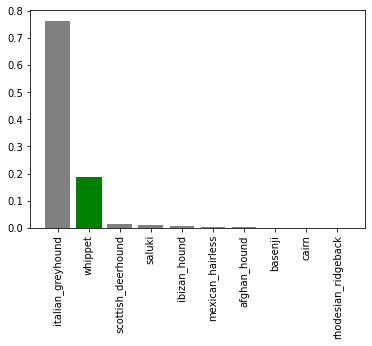

In [ ]:
# Testing nr 13
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels, n=13)

These functions will help visualize the predictions made by the model. Let's check out a few.

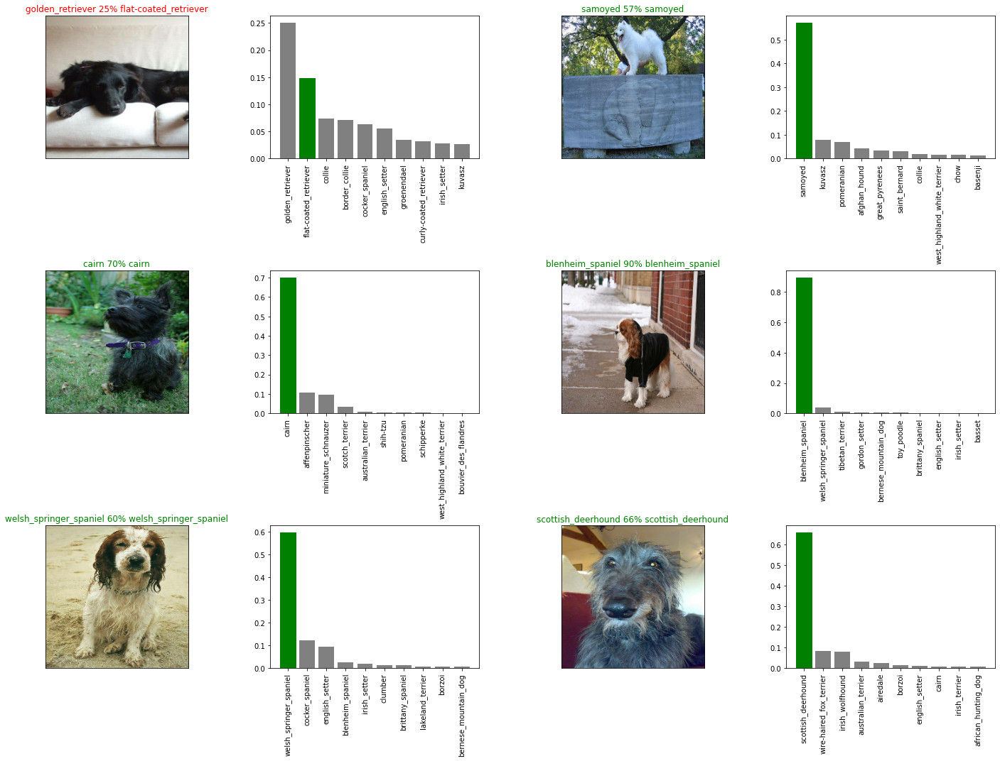

In [ ]:
# Checking a few preds and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

Based on the results above, I am creating a confusion matrix with the model's predictions and true labels.

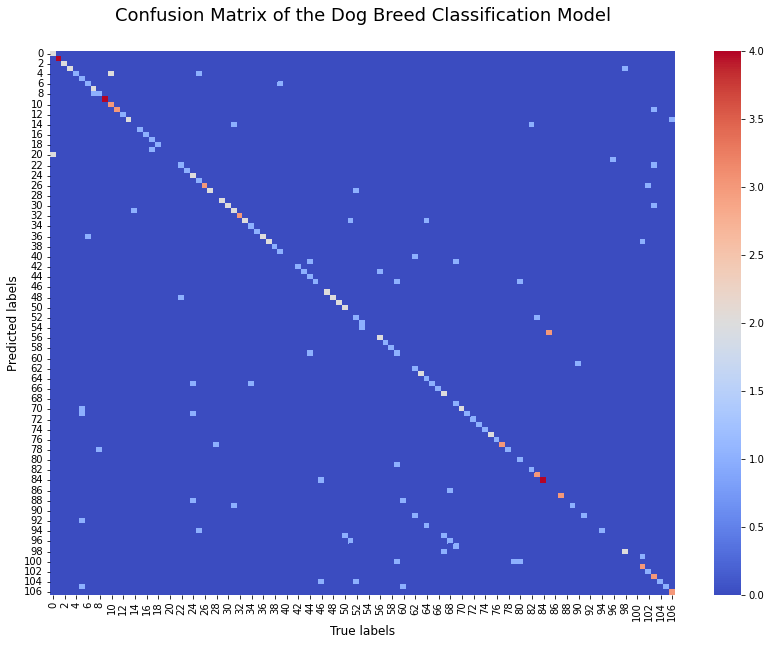

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_preds = np.array([get_pred_label(i) for i in predictions]) # predicted labels
c_matrix = confusion_matrix(val_labels, y_preds)

# Plotting confusion matrix from predictions
plt.figure(figsize=(14, 10))
sns.heatmap(c_matrix, cmap='coolwarm')

# Adding title and labels to the plot
plt.title('Confusion Matrix of the Dog Breed Classification Model', fontsize=18, pad=30)
plt.xlabel('True labels', fontsize=12)
plt.ylabel('Predicted labels', fontsize=12)

# Saving figure
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Dog Vision/confusion_matrix(without labels).png');

## Saving and reloading a trained model

In [ ]:
# Creating func to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str).
  """
  display(Image('/content/drive/MyDrive/64zk6u.jpg', height=250, width=350))

  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Colab Notebooks/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-&H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
from tensorflow.python.ops import custom_gradient
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f'Loading saved model from: {model_path}...')
  display(Image('/content/drive/MyDrive/64zlbf.jpg', height=250, width=350))
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now that there are functions to save and load a trained model, let's make sure they are working properly.

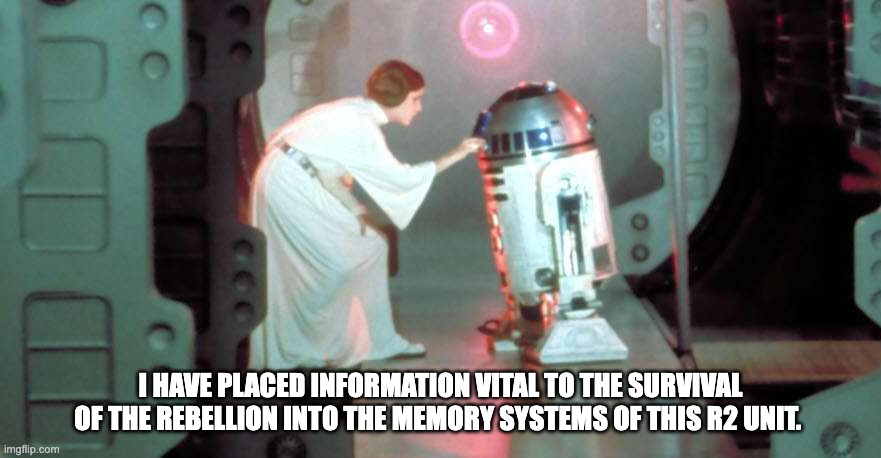

Saving model to: drive/MyDrive/Colab Notebooks/Dog Vision/models/20220214-&H231644852198-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog Vision/models/20220214-&H231644852198-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Saving current model (trained on 1000 images)
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog Vision/models/20220212-&H541644699295-1000-images-mobilenetv2-Adam.h5...


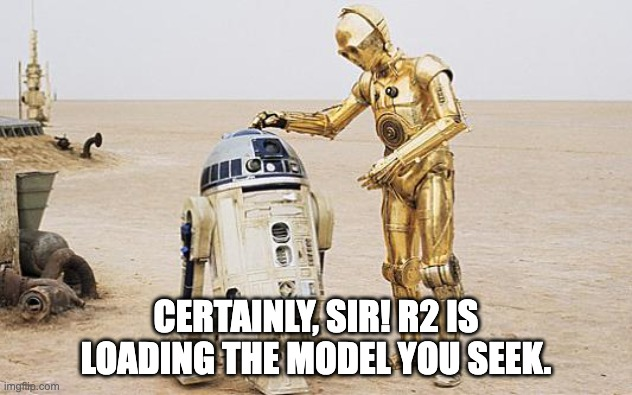

In [ ]:
# Loading a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Colab Notebooks/Dog Vision/models/20220212-&H541644699295-1000-images-mobilenetv2-Adam.h5')

In [ ]:
# Evaluating pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2903 - accuracy: 0.6600


[1.290283203125, 0.6600000262260437]

In [ ]:
# Evaluating loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.3031 - accuracy: 0.6550


[1.303124189376831, 0.6549999713897705]

## Training a big dog model 🐶 (on the full data)

In [ ]:
# Checking full size of data
print('Nr of filenames: ', len(X), '\nNr of labels: ', len(y))

Nr of filenames:  10222 
Nr of labels:  10222


In [ ]:
# Creating a data batch with the full dataset
full_ds = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_ds

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Creating a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Creating full model callbacks
fm_tensorboard = create_tensorboard_callback()

# No validation set when training on full data, so we cannot monitor validation accuracy
fm_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                     patience=3)

**Note:** Running the cell below will take longer (~30 minutes) for the first epoch, because the GPU that it's being used in the runtime has to load all the images into memory.

In [ ]:
# Fitting full model to the full data
full_model.fit(x=full_ds,
               epochs=NUM_EPOCHS,
               callbacks=[fm_tensorboard, fm_early_stopping])

Epoch 1/100
320/320 [==============================] - 43s 123ms/step - loss: 1.3410 - accuracy: 0.6663
Epoch 2/100
320/320 [==============================] - 39s 122ms/step - loss: 0.3999 - accuracy: 0.8871
Epoch 3/100
320/320 [==============================] - 39s 123ms/step - loss: 0.2367 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 38s 117ms/step - loss: 0.1532 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 37s 114ms/step - loss: 0.1065 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0770 - accuracy: 0.9872
Epoch 7/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0584 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0455 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 44s 139ms/step - loss: 0.0381 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 45s 139m

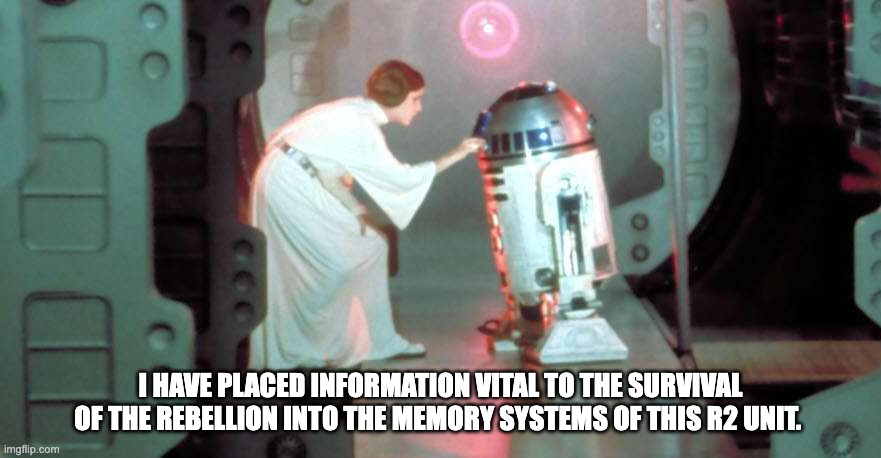

Saving model to: drive/MyDrive/Colab Notebooks/Dog Vision/models/20220214-&H401644853234-full-DS-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog Vision/models/20220214-&H401644853234-full-DS-mobilenetv2-Adam.h5'

In [ ]:
save_model(full_model, suffix='full-DS-mobilenetv2-Adam')

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog Vision/models/20220214-&H581644839927-full-DS-mobilenetv2-Adam.h5...


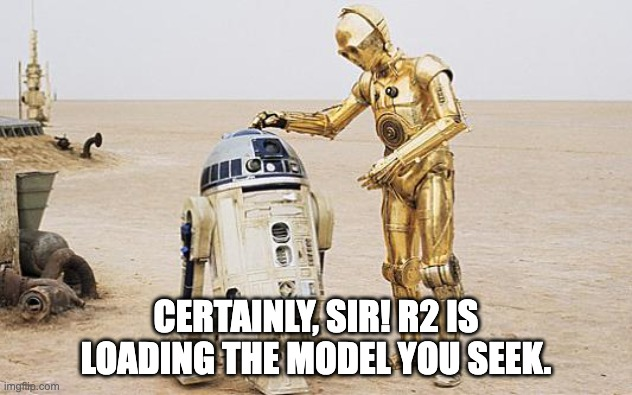

In [ ]:
# Loading full model
loaded_fm = load_model('drive/MyDrive/Colab Notebooks/Dog Vision/models/20220214-&H581644839927-full-DS-mobilenetv2-Adam.h5')

## Making predictions on the test dataset

Since the model has been trained on images in the form of tensor batches, the test data needs to be on the same format in order to make predictions.

Luckily I created `create_data_batches()` earlier which can take a lits of filenames as input and convert them into tensor batches.

To make predictions on the test data:
* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and set the `test_data` parameter to `True`, since it does not have labels. ✅
* Make a prediction array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Loading test image filenames
test_path = 'drive/MyDrive/Colab Notebooks/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog Vision/test/e1e7949f64ff3283a5dafa9d39199193.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/e21d378710d164f126e7d0b380dc7a1a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/ddf0164ab3a269b179051bdecaea34b0.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/df8d6d05e6f83c513a4ab0077207a72a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/deaf748bed865ec76758f086db04bfac.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/test/e79030be9c9769f3604474aea16039bd.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Creating test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Noted:** Calling `predict()`on the full model and passing the test data batch to it may take longer than usual (~60 min).

In [ ]:
# Making predictions on test data batch using the loaded full model
test_predictions = loaded_fm.predict(test_data, 
                                     verbose=1)

324/324 [==============================] - 164s 492ms/step


In [ ]:
# Saving predictions (NumPy array) to csv file (for later access)
np.savetxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
test_predictions[:10]

array([[6.4544784e-12, 3.4618914e-08, 2.7289584e-10, ..., 5.0835430e-12,
        3.5240911e-11, 1.1112368e-09],
       [5.6139361e-11, 9.9931335e-01, 3.4659381e-10, ..., 2.7397046e-08,
        1.6943343e-08, 7.7930711e-09],
       [4.5770796e-09, 2.2298141e-09, 1.5240868e-11, ..., 1.3124744e-08,
        2.5941299e-07, 2.1868368e-08],
       ...,
       [1.3103042e-08, 4.8024949e-11, 3.0638019e-09, ..., 3.9530854e-11,
        2.8362770e-10, 7.1972493e-12],
       [1.5821877e-11, 9.9990606e-01, 8.8076257e-09, ..., 1.5199443e-08,
        8.3268052e-11, 6.0368012e-07],
       [2.0672275e-04, 8.0282164e-10, 2.3084438e-07, ..., 2.8444012e-08,
        1.2082676e-06, 7.3617230e-07]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
# Loading predictions (NumPy array) from csv file
#test_predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/Dog Vision/preds_array.csv', delimiter=',')

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, it wants our models predriction probability outputs in a CSV with an ID column and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, it is necessary to:
* Create a Pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image IDs from their filepaths. ✅
* Add data (the prediction probabilities) to each of the dog breed columns. ✅
* Export DF as a CSV file in order to submit to Kaggle. ✅

In [ ]:
# Creating a Pandas DF with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))

In [ ]:
# Appending test image IDs to predictions DF
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1e7949f64ff3283a5dafa9d39199193,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dcfd3463e1d23d51b309b0385292870b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e21d378710d164f126e7d0b380dc7a1a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e0c767bc2bc03b909526f1861c712b13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e52a4321a8cb0dd3bcc8f4a68b75eee7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Adding prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1e7949f64ff3283a5dafa9d39199193,6.454478e-12,3.461891e-08,2.728958e-10,4.738228e-09,9.332735e-11,5.903205e-11,1.733190e-09,1.418080e-08,5.047948e-12,9.798342e-11,2.435299e-08,7.579378e-10,1.971491e-09,7.776774e-11,1.043701e-09,4.199348e-10,3.462840e-13,7.198466e-10,3.103456e-12,2.291941e-11,1.051167e-10,4.256236e-11,2.500185e-11,2.442987e-10,6.814132e-11,6.797478e-11,8.867210e-10,1.298870e-12,1.389317e-09,1.123797e-10,1.759084e-10,3.679979e-09,3.345431e-08,8.230539e-10,7.524426e-10,2.952733e-07,1.260948e-10,1.419394e-10,3.227274e-12,...,2.712296e-10,3.800132e-10,1.750424e-08,4.257691e-10,2.334426e-09,2.753333e-10,2.952583e-10,8.403613e-08,3.739372e-12,2.660121e-07,4.560486e-11,1.245196e-09,1.307451e-12,4.655504e-10,2.996329e-10,1.026814e-10,8.541149e-11,1.855685e-11,1.771548e-11,1.948711e-10,2.738732e-09,9.123170e-11,2.942225e-08,7.737718e-10,2.109544e-10,1.683413e-06,2.096921e-09,4.579042e-08,3.085549e-08,6.718010e-09,9.618482e-01,2.653002e-09,8.193238e-08,1.262147e-12,1.637378e-09,4.193255e-11,2.427489e-12,5.083543e-12,3.524091e-11,1.111237e-09
1,dcfd3463e1d23d51b309b0385292870b,5.613936e-11,9.993134e-01,3.465938e-10,3.060236e-07,7.708021e-10,2.045043e-09,4.223768e-10,3.780973e-10,6.431390e-11,6.731231e-13,4.696884e-08,6.195838e-10,1.280579e-08,5.866644e-08,1.503135e-07,1.505400e-09,1.121900e-09,5.657122e-12,6.223477e-08,6.063773e-10,1.582006e-07,6.167493e-10,1.319661e-09,5.335893e-04,9.286402e-12,2.000521e-06,1.674092e-09,2.022142e-10,1.714440e-09,2.289003e-13,3.599713e-09,9.091095e-09,7.369236e-08,7.919724e-08,3.178454e-11,6.432535e-10,1.916227e-11,2.073989e-09,1.251537e-08,...,8.234192e-11,9.028691e-10,2.550933e-06,7.023856e-05,2.849959e-10,1.640572e-10,3.790703e-12,5.512119e-11,2.545805e-10,3.968088e-11,1.185890e-08,4.037422e-08,5.801272e-08,2.912273e-06,9.464540e-12,1.829842e-10,1.170545e-10,8.256246e-06,3.355562e-10,1.374200e-09,2.514612e-08,5.338416e-10,3.132195e-09,2.364152e-07,2.681438e-10,5.796292e-09,9.939686e-07,1.382976e-08,1.156149e-06,4.336625e-07,1.883115e-10,4.845840e-12,3.562627e-11,1.311477e-08,1.073019e-08,2.415982e-09,2.911616e-11,2.739705e-08,1.694334e-08,7.793071e-09
2,e21d378710d164f126e7d0b380dc7a1a,4.577080e-09,2.229814e-09,1.524087e-11,2.144544e-08,4.222613e-10,2.812057e-10,1.538990e-08,2.538600e-12,5.641400e-11,2.598354e-09,6.987690e-11,2.016893e-11,1.043237e-12,1.477374e-10,1.396970e-08,7.611124e-11,5.480094e-13,9.998770e-01,1.133335e-12,5.471765e-11,1.561228e-09,3.951741e-07,9.977432e-05,5.440514e-11,1.000481e-12,1.010592e-09,4.121157e-09,4.228529e-10,1.344123e-10,3.638026e-09,1.274137e-11,1.938509e-12,1.444678e-08,2.250285e-12,1.168774e-12,1.250370e-07,7.212423e-10,1.939758e-10,1.725788e-11,...,1.084500e-10,1.193882e-05,1.235471e-14,1.080677e-12,1.812760e-09,3.199787e-09,1.023183e-10,1.264481e-12,2.054809e-09,8.323026e-10,4.563330e-10,1.066780e-11,2.368075e-10,3.434677e-13,4.349556e-13,5.783334e-09,3.172

In [ ]:
# Exporting DF to csv
preds_df.to_csv('drive/MyDrive/Colab Notebooks/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv',
                index=False)

Kaggle score  ➡️  0.88454

## Making predictions on custom images

To make predictions on custom images:
* Get filepath of the chose image(s). ✅
* Turn filepaths into data batches using `create_data_batches()` - since the custom images won't have labels, `test_data` parameter will be set to `True`. ✅
* Pass the custom image data batch to the model's `predict()` method.✅
* Convert the prediction output probabilities into prediction labels.✅
* Compare the predicted labels to the custom images.✅

In [101]:
# Getting custom image filepaths
custom_path = 'drive/MyDrive/Colab Notebooks/Dog Vision/doggos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [102]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/Dog Vision/doggos/image_three.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/doggos/image_one.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/doggos/image_four.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/doggos/image_two.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/doggos/image_five.jpg']

In [103]:
# Converting custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [104]:
# Making predictions on the custom data
custom_preds = loaded_fm.predict(custom_data)

In [105]:
custom_preds.shape

(5, 120)

In [106]:
# Getting custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['eskimo_dog', 'affenpinscher', 'pembroke', 'vizsla', 'english_foxhound']

In [107]:
# Getting custom images (unbatchify function won't work since there are no labels)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

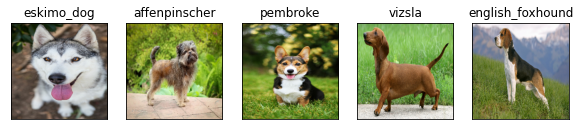

In [114]:
# Checking custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)